This notebook shows how to setup a new project, train a keypoint-MoSeq model and visualize the resulting syllables. You can load keypoint tracking results from SLEAP, DeepLabCut, or using your own custom format. We provide an [example DeepLabCut dataset](https://drive.google.com/drive/folders/1UNHQ_XCQEKLPPSjGspRopWBj6-YNDV6G?usp=share_link) that can be used for the tutorial.

# Project setup
Create a new project directory with a keypoint-MoSeq `config.yml` file.

In [1]:
import keypoint_moseq as kpms

bodyparts = ['nose','neck','anus','chest','rfoot','lfoot','rhand','lhand','tip']

skeleton=[
    ['neck', 'chest'],
    ['chest', 'anus'],
    ['nose', 'neck'],
    ['lhand', 'chest'],
    ['lfoot', 'anus'],
    ['rhand', 'chest'],
    ['rfoot', 'anus'],
    ['anus', 'tip']]

project_dir = 'C:/Users/MyPC/Desktop/git/kp_moseq/keypoint-moseq/project/SDSBD/dataset5/trainset1/'
video_dir= []

kpms.setup_project(
    project_dir,
    video_dir=video_dir,
    bodyparts=bodyparts,
    skeleton=skeleton, overwrite=True)

In [1]:
# load existed project (run this code after creating a project)

import keypoint_moseq as kpms

project_dir = 'C:/Users/MyPC/Desktop/git/kp_moseq/keypoint-moseq/project/SDSBD/dataset5/trainset1/'
video_dir= []
config = lambda: kpms.load_config(project_dir)

## Edit the config file

The config can be edited in a text editor or using the function `kpms.update_config`, as shown below. In general, the following parameters should be specified for each project:

- `bodyparts` (name of each keypoint; automatically imported from SLEAP/DeepLabCut)
- `use_bodyparts` (subset of bodyparts to use for modeling, set to all bodyparts by default; for mice we recommend excluding the tail)
- `anterior_bodyparts` and `posterior_bodyparts` (used for rotational alignment)
- `video_dir` (directory with videos of each experiment)

Edit the config as follows for the [example DeepLabCut dataset](https://drive.google.com/drive/folders/1UNHQ_XCQEKLPPSjGspRopWBj6-YNDV6G?usp=share_link):

In [17]:
kpms.update_config(
    project_dir,
    video_dir=video_dir,
    anterior_bodyparts=['nose'],
    posterior_bodyparts=['anus'],
    use_bodyparts=['nose','neck','anus','chest','rfoot','lfoot','rhand','lhand']
)

## Load data

The code below shows how to load keypoint detections from DeepLabCut. To load other formats, replace `'deeplabcut'` in the example with one of `'sleap', 'anipose', 'sleap-anipose', 'nwb'`. For other formats, see the [FAQ](https://keypoint-moseq.readthedocs.io/en/latest/FAQs.html#loading-keypoint-tracking-data).

In [2]:
import sys
sys.path.insert(0, 'C:/Users/MyPC/Desktop/git/AVATAR_motionMap')
import FileManager.csvload as acl

# load data from AVATAR .csv file
keypoint_data_path = acl.get_csv_paths(r'C:\Users\MyPC\Desktop\실험실\2.실험데이터\AVATAR-SDSBD\dataset5\trainset1.txt') # can be a file, a directory, or a list of files

coordinates, bodyparts = kpms.load_keypoints_AVATAR(keypoint_data_path, path_in_name=False, remove_extension=True)

# format data for modeling
data, metadata = kpms.format_data(coordinates, confidences=None, **config())

Loading keypoints: 100%|██████████| 28/28 [00:01<00:00, 18.67it/s]


## Calibration

The purpose of calibration is to learn the relationship between error and keypoint confidence scores. The resulting regression coefficients (`slope` and `intercept`) are used during modeling to set the noise prior on a per-frame, per-keypoint basis. One can also adjust the `confidence_threshold` parameter at this step, which is used to define outlier keypoints for PCA and model initialization. **This step can be skipped for the demo data** since the config already includes suitable regression coefficients.

- Run the cell below. A widget should appear with a video frame on the left.
    - *If the widget doesn't render, try using jupyter lab instead of jupyter notebook*
    
- Annotate each frame with the correct location of the labeled bodypart
    - Left click to specify the correct location - an "X" should appear.
    - Use the arrow buttons to annotate additional frames.
    - Each annotation adds a point to the right-hand scatter plot. 
    - Continue until the regression line stabilizes.
   
- At any point, adjust the confidence threshold by clicking on the scatter plot.

- Use the "save" button to update the config and store your annotations to disk.

In [ ]:
#kpms.noise_calibration(project_dir, coordinates, confidences, **config())

## Fit PCA

Run the cell below to fit a PCA model to aligned and centered keypoint coordinates.

- The model is saved to ``{project_dir}/pca.p`` and can be reloaded using ``kpms.load_pca``. 
- Two plots are generated: a cumulative [scree plot](https://en.wikipedia.org/wiki/Scree_plot) and a depiction of each PC, where translucent nodes/edges represent the mean pose and opaque nodes/edges represent a perturbation in the direction of the PC. 
- After fitting, edit `latent_dimension` in the config. This determines the dimension of the pose trajectory used to fit keypoint-MoSeq. A good heuristic is the number of dimensions needed to explain 90% of variance, or 10 dimensions - whichever is lower.  

>=90.0% of variance exlained by 9 components.


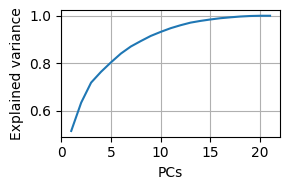

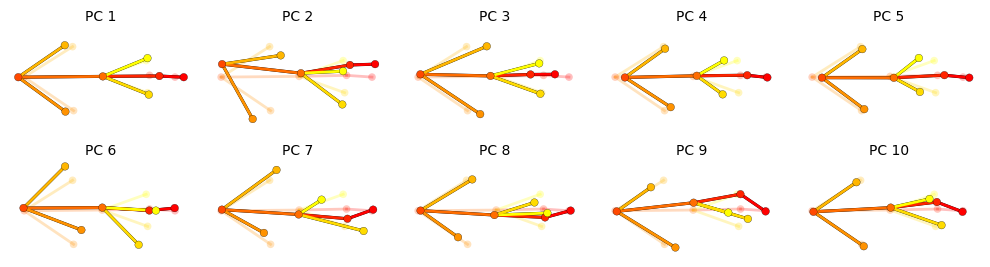

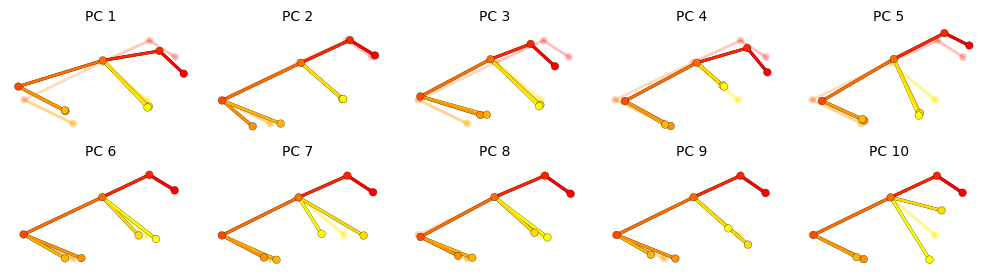

Saved interactive plot to C:/Users/MyPC/Desktop/git/kp_moseq/keypoint-moseq/project/SDSBD/dataset5/trainset1/pcs.html


In [5]:
pca = kpms.fit_pca(**data, **config())
kpms.save_pca(pca, project_dir)

kpms.print_dims_to_explain_variance(pca, 0.9)
kpms.plot_scree(pca, project_dir=project_dir)
kpms.plot_pcs(pca, project_dir=project_dir, **config())

In [ ]:
pca_3d = kpms.plot_pcs_3D(pca, project_dir=project_dir, **config())

In [9]:
# use the following to load an already existing PCA model
pca = kpms.load_pca(project_dir)

In [ ]:
# June modification for plotting only
kpms.plot_pcs(pca, project_dir=project_dir, plot_n_pcs=9, **config())

In [7]:
kpms.update_config(project_dir, latent_dim=9)

# Model fitting

Fitting a keypoint-MoSeq model involves:
1. **Initialization:** Auto-regressive (AR) parameters and syllable sequences are randomly initialized using pose trajectories from PCA.
2. **Fitting an AR-HMM:** The AR parameters, transition probabilities and syllable sequences are iteratively updated through Gibbs sampling. 
3. **Fitting the full model:** All parameters, including both the AR-HMM as well as centroid, heading, noise-estimates and continuous latent states (i.e. pose trajectories) are iteratively updated through Gibbs sampling. This step is especially useful for noisy data.
4. **Extracting model results:** The learned states of the model are parsed and saved to disk for vizualization and downstream analysis.
4. **[Optional] Applying the trained model:** The learned model parameters can be used to infer a syllable sequences for additional data.

## Setting kappa

Most users will need to adjust the **kappa** hyperparameter to achieve the desired distribution of syllable durations. For this tutorial we chose kappa values that yielded a median syllable duration of 400ms (12 frames). Most users will need to tune kappa to their particular dataset. Higher values of kappa lead to longer syllables. **You will need to pick two kappas: one for AR-HMM fitting and one for the full model.**
- We recommend iteratively updating kappa and refitting the model until the target syllable time-scale is attained.  
- Model fitting can be stopped at any time by interrupting the kernel, and then restarted with a new kappa value.
- The full model will generally require a lower value of kappa to yield the same target syllable durations. 
- To adjust the value of kappa in the model, use `kpms.update_hypparams` as shown below. Note that this command only changes kappa in the model dictionary, not the kappa value in the config file. The value in the config is only used during model initialization.

## Initialization

In [10]:
# initialize the model
model = kpms.init_model(data, pca=pca, **config())

In [11]:
# optionally modify kappa
model = kpms.update_hypparams(model, kappa=1e8)

## Fitting an AR-HMM

In addition to fitting an AR-HMM, the function below:
- generates a name for the model and a corresponding directory in `project_dir`
- saves a checkpoint every 25 iterations from which fitting can be restarted
- plots the progress of fitting every 25 iterations, including
    - the distributions of syllable frequencies and durations for the most recent iteration
    - the change in median syllable duration across fitting iterations
    - a sample of the syllable sequence across iterations in a random window

Outputs will be saved to C:/Users/MyPC/Desktop/git/kp_moseq/keypoint-
moseq/project/SDSBD/dataset5/trainset1/2024_01_04-13_41_21


 33%|███████████▍                       | 20/61 [07:02<14:08, 20.70s/it]

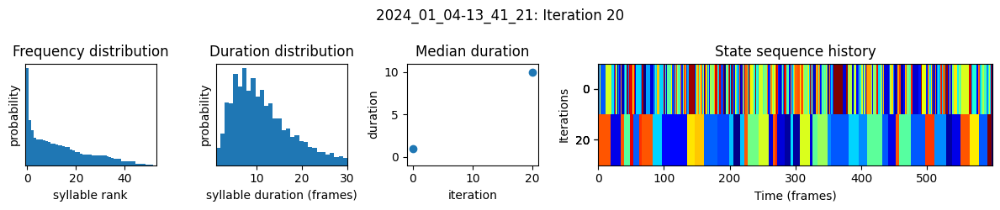

 66%|██████████████████████▉            | 40/61 [13:58<07:10, 20.51s/it]

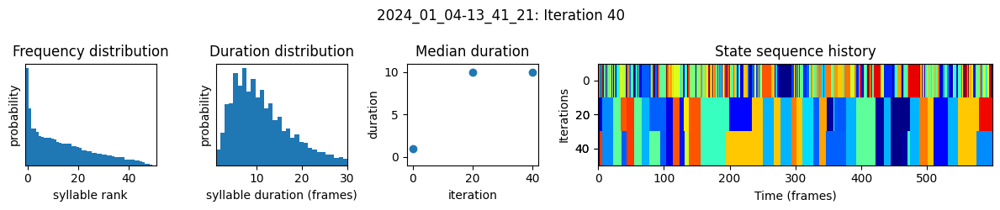

 98%|██████████████████████████████████▍| 60/61 [20:43<00:20, 20.07s/it]

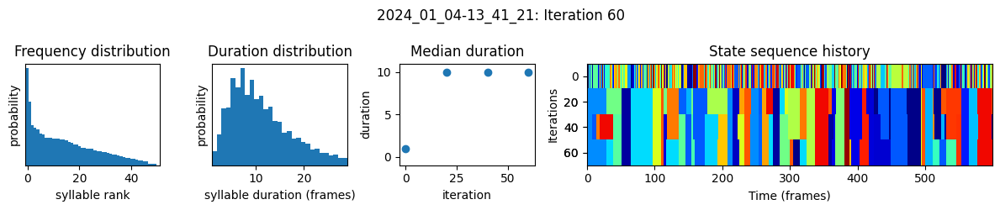

100%|███████████████████████████████████| 61/61 [21:03<00:00, 20.71s/it]


In [12]:
num_ar_iters = 60

model, model_name = kpms.fit_model(
    model=model, data=data, metadata=metadata, project_dir=project_dir,
    ar_only=True, num_iters=num_ar_iters, save_every_n_iters = 20)

## Fitting the full model

The following code fits a full keypoint-MoSeq model using the results of AR-HMM fitting for initialization. If using your own data, you may need to try a few values of kappa at this step. 

In [13]:
model_name = '2024_01_04-13_41_21'

num_ar_iters = 60

Outputs will be saved to C:/Users/MyPC/Desktop/git/kp_moseq/keypoint-
moseq/project/SDSBD/dataset5/trainset1/2024_01_04-13_41_21


 49%|█████████████████                  | 20/41 [18:31<19:17, 55.11s/it]

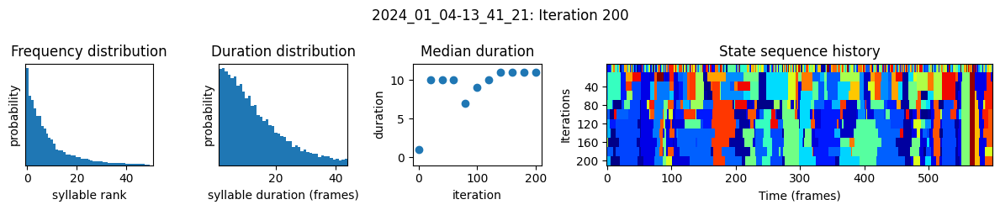

 98%|██████████████████████████████████▏| 40/41 [37:13<00:55, 55.77s/it]

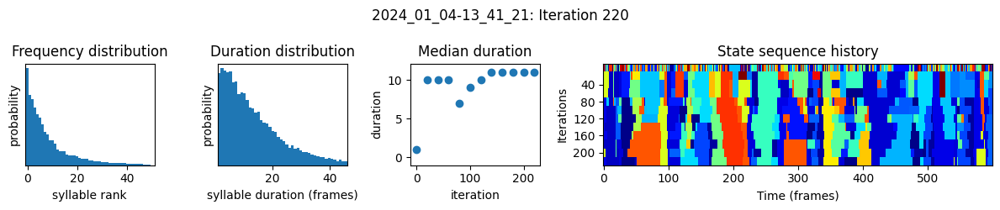

100%|███████████████████████████████████| 41/41 [38:07<00:00, 55.79s/it]


In [16]:
# load model checkpoint generated during step 2 (AR-HMM fitting)
# model, data, metadata, current_iter = kpms.load_checkpoint(
#    project_dir, model_name, iteration=num_ar_iters)
model, data, metadata, current_iter = kpms.load_checkpoint(
 project_dir, model_name)

# modify kappa to maintain the desired syllable time-scale
model = kpms.update_hypparams(model, kappa=5e3)

# run fitting for an additional 200 iters
model = kpms.fit_model(
    model, data, metadata, project_dir, model_name, ar_only=False, 
    start_iter=current_iter, num_iters=current_iter+40, save_every_n_iters =20, parallel_message_passing=False)[0]

## Sort syllables by frequency

Permute the states and parameters of a saved checkpoint so that syllables are labeled in order of frequency (i.e. so that `0` is the most frequent, `1` is the second most, and so on). 

In [17]:
# modify a saved checkpoint so syllables are ordered by frequency
kpms.reindex_syllables_in_checkpoint(project_dir, model_name)

Reindexing:   0%|                    | 0/12 [00:00<?, ?model snapshot/s]

Reindexing: 100%|███████████| 12/12 [00:02<00:00,  4.98model snapshot/s]


array([ 3,  8,  9, 19, 22, 46, 61, 81, 34,  1, 41, 33, 55, 26, 48, 30, 21,
        6, 69, 15,  7, 84, 77, 89, 91, 45, 75, 73, 49, 65, 31, 43, 53, 24,
       56, 60, 14, 87, 32, 44, 13, 99, 66, 63, 42, 85, 57, 70, 86, 76, 36,
       90, 59, 23, 72, 50,  5, 38, 97, 16, 12, 17, 20, 96, 82, 93,  4, 28,
       54, 71, 62, 83, 10, 68, 92, 18, 95, 52, 47, 64, 80, 25, 79, 29,  2,
       74, 67, 88, 40, 39, 37,  0, 11, 98, 94, 35, 27, 78, 51, 58],
      dtype=int64)

```{warning}
Reindexing is only applied to the checkpoint file. Therefore, if you perform this step after extracting the modeling results or generating vizualizations, then those steps must be repeated.
```

## Extract model results

Parse the modeling results and save them to `{project_dir}/{model_name}/results.h5`. The results are stored as follows, and can be reloaded at a later time using `kpms.load_results`. Check the docs for an [in-depth explanation of the modeling results](https://keypoint-moseq.readthedocs.io/en/latest/FAQs.html#interpreting-model-outputs).
```
    results.h5
    ├──recording_name1
    │  ├──syllable      # syllable labels (z)
    │  ├──latent_state  # inferred low-dim pose state (x)
    │  ├──centroid      # inferred centroid (v)
    │  └──heading       # inferred heading (h)
    ⋮
```

In [18]:
# load the most recent model checkpoint
model_name = '2024_01_04-13_41_21'
#model = kpms.load_checkpoint(project_dir, model_name)[0]
pca = kpms.load_pca(project_dir)
model, data, metadata, current_iter = kpms.load_checkpoint(project_dir, model_name)

# extract results
results = kpms.extract_results(model, metadata, project_dir, model_name)

Saved results to C:/Users/MyPC/Desktop/git/kp_moseq/keypoint-
moseq/project/SDSBD/dataset5/trainset1/2024_01_04-13_41_21\results.h5


In [11]:
# from keypoint_moseq.io import save_hdf5
# save_hdf5(r'C:\Users\MyPC\Desktop\git\kp_moseq\keypoint-moseq\project\SDSBD\dataset3\trainset1\2023_08_23-15_27_30\results.h5', results)

### [Optional] Save results to csv

After extracting to an h5 file, the results can also be saved as csv files. A separate file will be created for each recording and saved to `{project_dir}/{model_name}/results/`. 

In [19]:
# optionally save results as csv
kpms.save_results_as_csv(results, project_dir, model_name)

Saving to csv: 100%|████████████████████| 28/28 [00:02<00:00, 10.30it/s]


## Apply to new data

The code below shows how to apply a trained model to new data. This is useful if you have performed new experiments and would like to maintain an existing set of syllables. The results for the new experiments will be added to the existing `results.h5` file. **This step is optional and can be skipped if you do not have new data to add**.

In [1]:
# run this code after creating a project

import keypoint_moseq as kpms

project_dir = 'C:/Users/MyPC/Desktop/git/kp_moseq/keypoint-moseq/project/SDSBD/dataset5/trainset1/'
video_dir= []
config = lambda: kpms.load_config(project_dir)

In [20]:
## Junesu - For many folders, batch analysis
import sys
sys.path.insert(0, 'C:/Users/MyPC/Desktop/git/AVATAR_motionMap')
import FileManager.csvload as acl

# load saved model checkpoint
model_name = '2024_01_04-13_41_21'
model = kpms.load_checkpoint(project_dir, model_name)[0]
pca = kpms.load_pca(project_dir)

# load new data (e.g. from deeplabcut)
new_data = acl.get_csv_paths(r'C:\Users\MyPC\Desktop\실험실\2.실험데이터\AVATAR-SDSBD\dataset5\testset1.txt')

chunk_size = 5  # The size of the small list you want to divide
for i in range(0, len(new_data), chunk_size):
    batch = new_data[i:i + chunk_size]
    coordinates, bodyparts = kpms.load_keypoints_AVATAR(batch, path_in_name=False, remove_extension=True)
    data, metadata = kpms.format_data(coordinates, confidences=None, **config())
    results = kpms.apply_model(model, pca, data, metadata, project_dir, model_name, num_iters=30,**config())

    # optionally rerun `save_results_as_csv` to export the new results
    kpms.save_results_as_csv(results, project_dir, model_name)

Applying model: 100%|███████████████████| 30/30 [10:59<00:00, 22.00s/it]


Saved results to C:/Users/MyPC/Desktop/git/kp_moseq/keypoint-
moseq/project/SDSBD/dataset5/trainset1/2024_01_04-13_41_21\results.h5


Applying model: 100%|███████████████████| 30/30 [09:49<00:00, 19.64s/it]


Saved results to C:/Users/MyPC/Desktop/git/kp_moseq/keypoint-
moseq/project/SDSBD/dataset5/trainset1/2024_01_04-13_41_21\results.h5


Applying model: 100%|███████████████████| 30/30 [09:45<00:00, 19.51s/it]


Saved results to C:/Users/MyPC/Desktop/git/kp_moseq/keypoint-
moseq/project/SDSBD/dataset5/trainset1/2024_01_04-13_41_21\results.h5


Applying model: 100%|███████████████████| 30/30 [09:42<00:00, 19.42s/it]


Saved results to C:/Users/MyPC/Desktop/git/kp_moseq/keypoint-
moseq/project/SDSBD/dataset5/trainset1/2024_01_04-13_41_21\results.h5


Applying model: 100%|███████████████████| 30/30 [09:29<00:00, 18.99s/it]


Saved results to C:/Users/MyPC/Desktop/git/kp_moseq/keypoint-
moseq/project/SDSBD/dataset5/trainset1/2024_01_04-13_41_21\results.h5


Applying model: 100%|███████████████████| 30/30 [09:13<00:00, 18.45s/it]


Saved results to C:/Users/MyPC/Desktop/git/kp_moseq/keypoint-
moseq/project/SDSBD/dataset5/trainset1/2024_01_04-13_41_21\results.h5


Applying model: 100%|███████████████████| 30/30 [09:12<00:00, 18.41s/it]


Saved results to C:/Users/MyPC/Desktop/git/kp_moseq/keypoint-
moseq/project/SDSBD/dataset5/trainset1/2024_01_04-13_41_21\results.h5


Applying model: 100%|███████████████████| 30/30 [09:07<00:00, 18.27s/it]


Saved results to C:/Users/MyPC/Desktop/git/kp_moseq/keypoint-
moseq/project/SDSBD/dataset5/trainset1/2024_01_04-13_41_21\results.h5


Applying model: 100%|███████████████████| 30/30 [09:44<00:00, 19.49s/it]


Saved results to C:/Users/MyPC/Desktop/git/kp_moseq/keypoint-
moseq/project/SDSBD/dataset5/trainset1/2024_01_04-13_41_21\results.h5


Applying model: 100%|███████████████████| 30/30 [10:34<00:00, 21.16s/it]


Saved results to C:/Users/MyPC/Desktop/git/kp_moseq/keypoint-
moseq/project/SDSBD/dataset5/trainset1/2024_01_04-13_41_21\results.h5


Saving to csv: 100%|██████████████████████| 4/4 [00:00<00:00, 10.60it/s]


# Visualization

## Trajectory plots
Generate plots showing the median trajectory of poses associated with each given syllable. 

In [27]:
import keypoint_moseq as kpms

#project_dir = 'C:/Users/MyPC/Desktop/git/kp_moseq/keypoint-moseq/project/SDSBD_trainset3/'
#model_name = '2023_08_20-21_21_41'

results = kpms.load_results(project_dir, model_name)
min_frequency = 0.005
fps = 20

Loading keypoints:   0%|          | 0/77 [00:00<?, ?it/s]

Loading keypoints: 100%|██████████| 77/77 [00:04<00:00, 18.07it/s]


Saving trajectory plots to C:/Users/MyPC/Desktop/git/kp_moseq/keypoint-moseq/project/SDSBD/dataset5/trainset1/2024_01_04-13_41_21\trajectory_plots


Generating trajectory plots: 100%|██████| 26/26 [00:11<00:00,  2.20it/s]


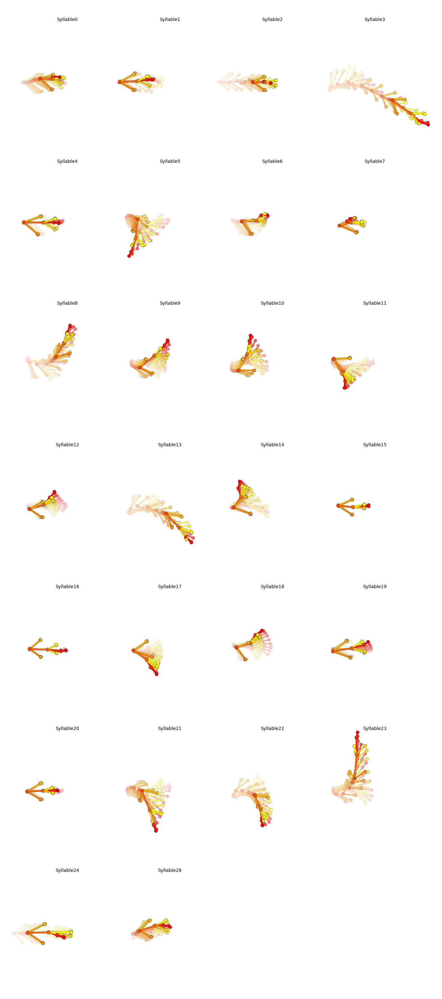

Generating trajectory plots: 100%|██████| 26/26 [00:11<00:00,  2.22it/s]


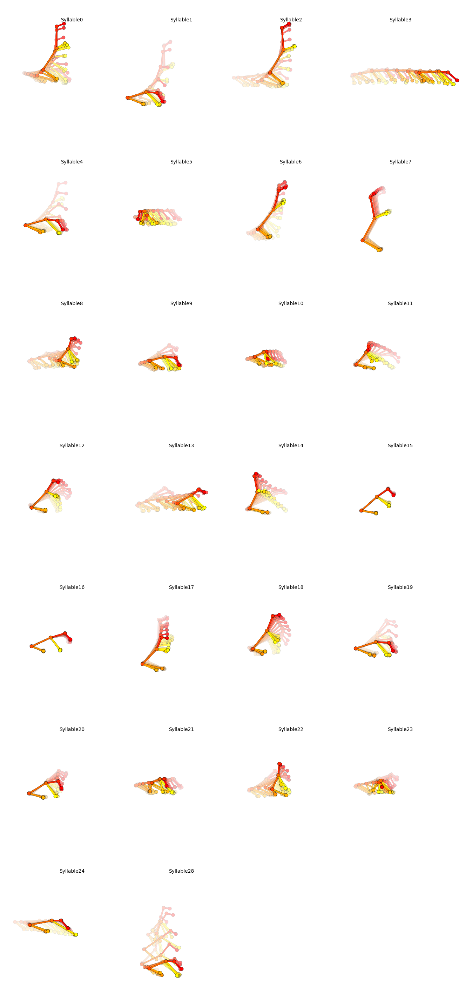

Saved interactive trajectories plot to C:/Users/MyPC/Desktop/git/kp_moseq/keypoint-moseq/project/SDSBD/dataset5/trainset1/2024_01_04-13_41_21\trajectory_plots\all_trajectories.html


In [28]:
keypoint_data_path = acl.get_csv_paths(r'C:\Users\MyPC\Desktop\실험실\2.실험데이터\AVATAR-SDSBD\dataset5\trainset1.txt')
new_data = acl.get_csv_paths(r'C:\Users\MyPC\Desktop\실험실\2.실험데이터\AVATAR-SDSBD\dataset5\testset1.txt')

dataset = [keypoint_data_path, new_data] #acl.get_csv_paths(r'C:\Users\MyPC\Desktop\실험실\2.실험데이터\AVATAR-SDSBD\dataset3\kp-moseq\totaldata.txt')
coordinates, bodyparts = kpms.load_keypoints_AVATAR(dataset, path_in_name=False, remove_extension=True)


# Users occasionally find that the trajectory plot and grid movie for a given syllable don’t match up. 

## Why do my trajectory plots and grid movies disagree?
# For example the animal might turn left in the trajectory plot but not consistently do so in the grid movie. 
# Similarly, trajectory plots can occasionally change dramatically when a trained keypoint-MoSeq model is applied to new data. 
# In most cases, these inconsistencies are caused by density sampling of syllable instances. 
# Turning this feature off may result in more stable trajectory plots.
# kpms.generate_trajectory_plots(..., density_sample=False)


kpms.generate_trajectory_plots(coordinates, results, project_dir, model_name, min_frequency = min_frequency, min_duration=2, fps=fps, **config())

In [29]:
syllable_viz = 28  # syllable number to be visualized

(<Figure size 640x480 with 1 Axes>,
 <Axes: title={'center': 'Frequency distribution'}, xlabel='syllable rank', ylabel='probability'>)

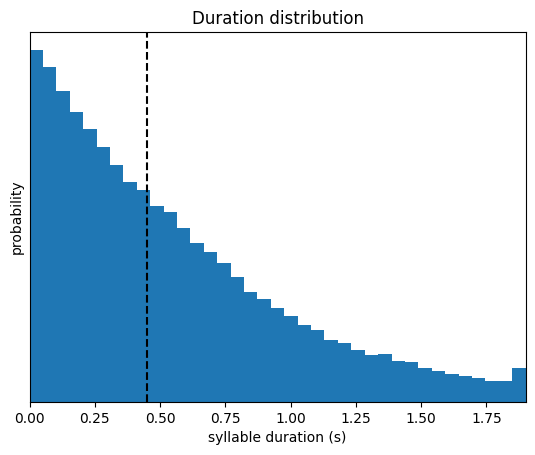

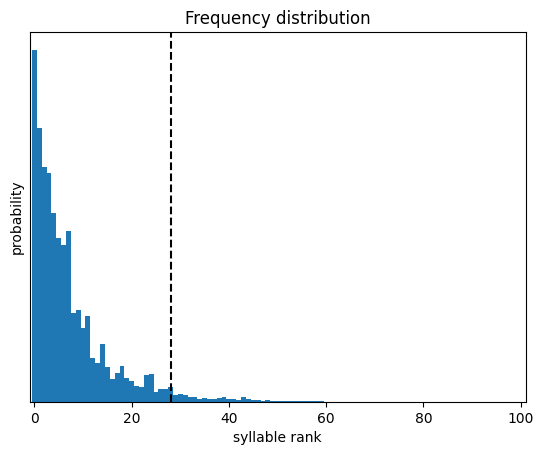

In [34]:
kpms.plot_duration_distribution(model_name=model_name, project_dir=project_dir, fps=fps, num_bins=1000)
kpms.plot_syllable_frequencies(model_name=model_name, project_dir=project_dir, min_frequency = 0, syllable_viz = syllable_viz)

## Grid movies
Generate video clips showing examples of each syllable.

In [20]:
#kpms.generate_grid_movies(results, project_dir, model_name, coordinates=coordinates, **config())

# for 3D data, include the flag `keypoints_only=True`
keypoint_data_path = acl.get_csv_paths(r'C:\Users\MyPC\Desktop\실험실\2.실험데이터\AVATAR-SDSBD\dataset5\trainset1.txt')
new_data = acl.get_csv_paths(r'C:\Users\MyPC\Desktop\실험실\2.실험데이터\AVATAR-SDSBD\dataset5\testset1.txt')

dataset = [keypoint_data_path, new_data] #acl.get_csv_paths(r'C:\Users\MyPC\Desktop\실험실\2.실험데이터\AVATAR-SDSBD\dataset3\kp-moseq\totaldata.txt')
coordinates, bodyparts = kpms.load_keypoints_AVATAR(dataset, path_in_name=False, remove_extension=True)

Loading keypoints:   0%|          | 0/124 [00:00<?, ?it/s]

Loading keypoints: 100%|██████████| 124/124 [00:03<00:00, 40.10it/s]


In [42]:
SCALE_FACTOR = 10

results_rescaled = {}
for k,v in results.items():
    v_rescaled = dict(v)
    v_rescaled['centroid'] = v['centroid'] * SCALE_FACTOR
    results_rescaled[k] = v_rescaled

coordinates_rescaled = {}
for k,v in coordinates.items():
    v_rescaled = v * SCALE_FACTOR
    coordinates_rescaled[k] = v_rescaled


In [45]:
kpms.generate_grid_movies(results_rescaled, project_dir, model_name, coordinates=coordinates_rescaled, min_frequency=0,filter_size = 6,
                        keypoints_only=True, fps=fps, use_dims=[0,1], pre=40, post=40, rows=3, cols=4, window_size=16*14, **config())

Writing grid movies to C:/Users/MyPC/Desktop/git/kp_moseq/keypoint-moseq/project/SDSBD/dataset5/trainset1/2024_01_02-16_22_36\grid_movies


Generating grid movies: 100%|███████████| 52/52 [04:14<00:00,  4.90s/it]


## Syllable Dendrogram
Plot a dendrogram representing distances between each syllable's median trajectory.

Saving dendrogram plot to C:/Users/MyPC/Desktop/git/kp_moseq/keypoint-moseq/project/SDSBD/dataset5/trainset1/2024_01_02-16_22_36\similarity_dendrogram


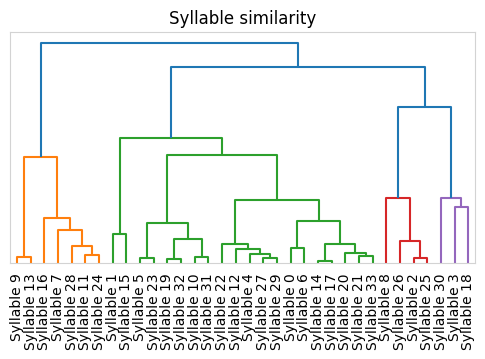

In [47]:
kpms.plot_similarity_dendrogram(coordinates, results, project_dir, model_name, min_frequency=0.001, **config())